I had only 1 day for this little task so my goal wat to came up with something simple yet effective. One of the key restrictments was to make sure my program can show what keypoints it took to make the prediction about pictures matching. So my approach was to use some model to find this keypoints and then use brute-force matcher to match theese keypoints. To make model work, i tried a lot of different preprocessing techniches and couple of different keypoints detection methods. In conclusion I used gaussian blur as preprocessor and SIFT algorythm for keypoint detection. I used this algorythm because it was a lot more accurate then BRIEF or ORB yet it was faster then AKAZE so it was a perfect balance between accuracy and speed. However, to use it on my machine i had to split image into smaller chunks, analize them separately and combine the result in the end. So for stable image this mathod works perfectly, even with different seasons and a little cloudy weather. However this method will break if there are too many clouds, or if the images are shifted. So one big improvement that can be made is maybe to use different bands of satellite image. Satellite "images" usually have a lot of different bands with a lot of data from the electromagnetic spectrum of that region and you can get a info like NDSI (which basically shows big bodies of water) or some other useful info


In [26]:
import os

import numpy as np 
import pandas as pd
import geopandas as gpd
from itertools import product

import rasterio
from rasterio.plot import reshape_as_image
from rasterio.features import rasterize

from shapely.geometry import mapping, Point, Polygon
from shapely.ops import cascaded_union

import cv2

import matplotlib.pyplot as plt

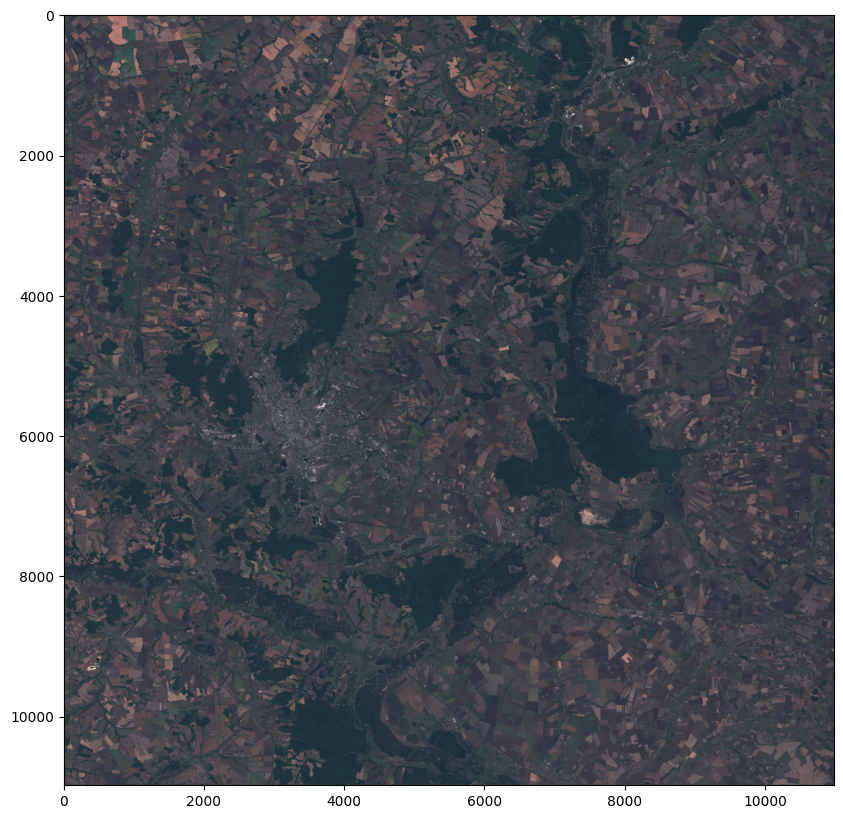

In [20]:
RASTER_PATH = "/".join("data\S23AB8~1\S2A_MS~1.SAF\GRANULE\L1C_T3~1\IMG_DATA\T393F9~1.JP2".split("\\"))
RASTER_PATH = "/".join("data\S2020B~1\S2A_MS~1.SAF\GRANULE\L1C_T3~1\IMG_DATA\T34C88~1.JP2".split("\\"))

with rasterio.open(RASTER_PATH, "r", driver='JP2OpenJPEG') as src:
    raster_img = src.read()
    raster_meta = src.meta
raster_img = reshape_as_image(raster_img)
plt.figure(figsize=(10, 10))
plt.imshow(raster_img)

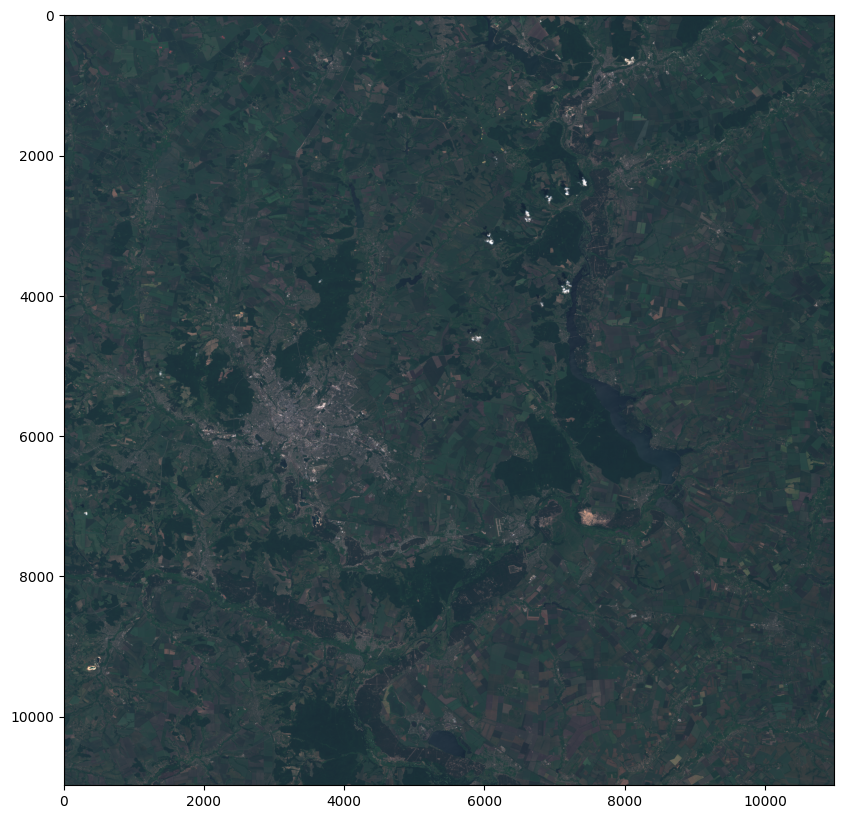

In [100]:
RASTER_PATH = 'data/S2B_MSIL1C_20190611T083609_N0207_R064_T36UYA_20190611T122426/S2B_MSIL1C_20190611T083609_N0207_R064_T36UYA_20190611T122426.SAFE/GRANULE/L1C_T36UYA_A011816_20190611T084501/IMG_DATA/T36UYA_20190611T083609_TCI.jp2'

with rasterio.open(RASTER_PATH, "r", driver='JP2OpenJPEG') as src:
    raster_img = src.read()
    raster_meta = src.meta
raster_img = reshape_as_image(raster_img)
plt.figure(figsize=(10, 10))
plt.imshow(raster_img)

In [93]:
len(raster_img)

10980

In [136]:
def cut_and_save_image(img_path, output_dir, piece_size=2000):
    """
    Cut the raster image into smaller pieces and save them as JP2 files.

    :param raster_img: The large raster image to be cut.
    :param raster_meta: Metadata of the raster image.
    :param output_dir: Directory to save the cut images.
    :param piece_size: Size of the smaller pieces, default is 2000x2000.
    """
    with rasterio.open(img_path, "r", driver='JP2OpenJPEG') as src:
        raster_img = src.read()
        raster_meta = src.meta
    raster_img = reshape_as_image(raster_img)
    # Create the output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Get the dimensions of the raster image
    height, width, channels = raster_img.shape
    
    # Calculate the number of pieces in each dimension
    num_pieces_horizontal = width // piece_size
    num_pieces_vertical = height // piece_size
    
    # Cut and save each piece
    for i in range(num_pieces_vertical):
        for j in range(num_pieces_horizontal):
            top = i * piece_size
            left = j * piece_size
            bottom = min((i + 1) * piece_size, height)
            right = min((j + 1) * piece_size, width)
            # Extract the piece
            piece = raster_img[top:bottom, left:right]
            
            # Modify metadata for the piece
            piece_meta = raster_meta.copy()
            piece_meta['width'], piece_meta['height'] = right - left, bottom - top
            piece_meta['transform'] = rasterio.windows.transform(
                rasterio.windows.Window(left, top, right - left, bottom - top),
                raster_meta['transform']
            )
            piece_meta['count'] = channels

            # Save the piece
            piece_filename = os.path.join(output_dir, f'piece_{i}_{j}.jp2')
            with rasterio.open(piece_filename, 'w', **piece_meta) as dest:
                # Convert piece back to rasterio format and write
                for k in range(channels):
                    dest.write(piece[:, :, k], k + 1)



In [137]:
image_path1 = 'data/S2B_MSIL1C_20190611T083609_N0207_R064_T36UYA_20190611T122426/S2B_MSIL1C_20190611T083609_N0207_R064_T36UYA_20190611T122426.SAFE/GRANULE/L1C_T36UYA_A011816_20190611T084501/IMG_DATA/T36UYA_20190611T083609_TCI.jp2'
output_path1 = 'data/chunks_1'  
image_path2 = "/".join("data\S23AB8~1\S2A_MS~1.SAF\GRANULE\L1C_T3~1\IMG_DATA\T393F9~1.JP2".split("\\"))  
output_path2 = 'data/chunks_2'

cut_and_save_image(image_path1, output_path1)
cut_and_save_image(image_path2, output_path2)

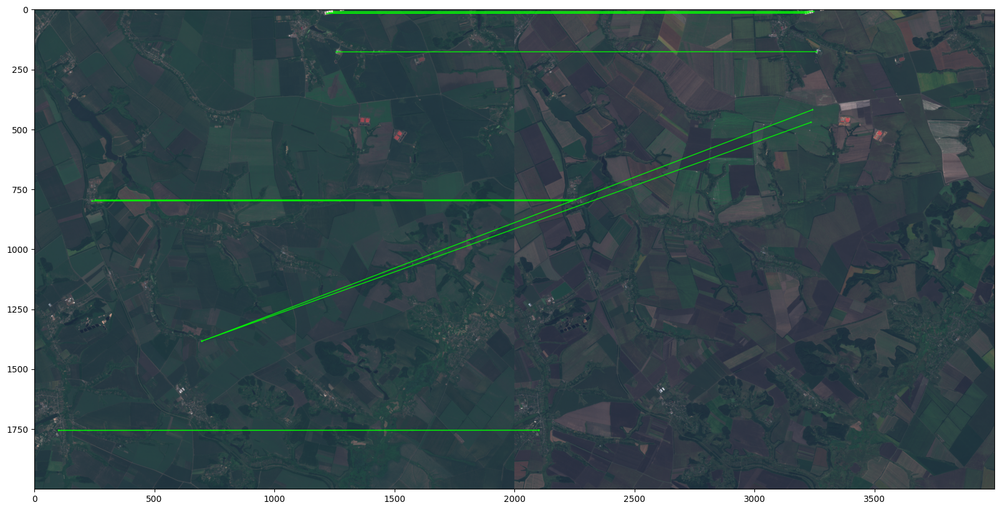

In [11]:
RASTER_PATH1 = "data/chunks_1/piece_0_0.jp2"
RASTER_PATH2 = "data/chunks_2/piece_0_0.jp2"
def preprocess_image(image_path,ksize=3):
    """
    Calculates the Normalized Difference Snow Index (NDSI) for a satellite image.

    Parameters:
    image_path (str): The file path of the satellite image.
    green_band (int): The band number corresponding to the Green channel.
    swir_band (int): The band number corresponding to the Shortwave Infrared (SWIR) channel.

    Returns:
    ndarray: An array representing the NDSI mask.
    """
    with rasterio.open(image_path, "r", driver='JP2OpenJPEG') as src:
        raster_img1 = src.read()
        raster_meta = src.meta
    image = reshape_as_image(raster_img1)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    appied_img = cv2.GaussianBlur(gray, (5, 5), 0)

    
    if appied_img.dtype != np.uint8:
        # Normalize the image to 0-255 and convert to 8-bit unsigned integer
        normalized_image = cv2.normalize(appied_img, None, 0, 255, cv2.NORM_MINMAX)
        image_8u = np.uint8(normalized_image)
    else:
        image_8u = appied_img
   

        

    return image_8u, image
raster_img1, img1 = preprocess_image(RASTER_PATH1)
raster_img2, img2 = preprocess_image(RASTER_PATH2)

sift = cv2.SIFT_create()
keypoints1, descriptors1 = sift.detectAndCompute(raster_img1, None)
keypoints2, descriptors2 = sift.detectAndCompute(raster_img2, None)

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(descriptors1, descriptors2)
match_color = (0, 255, 0)  # Green color for matches
single_point_color = (255, 0, 0)  # Blue color for points
matches_thickness =2

# Draw first N matches with the new parameters
# matches, accuracy = make_good_matches(matches)
matches = sorted(matches, key=lambda x: x.distance)

matches_img = cv2.drawMatches(
    img1, keypoints1, 
    img2, keypoints2, 
    matches[:10], 
    None, 
    matchColor=match_color,
    singlePointColor=single_point_color,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
    matchesThickness=matches_thickness
)

plt.figure(figsize=(20, 10))  # Increase figure size to make details clearer
plt.imshow(matches_img)
plt.show()

In [17]:
def make_good_matches(matches,keypoints1,keypoints2):
    threshold_distance = 10  # pixels

    # Filter matches based on the distance between their coordinates
    good_matches = []
    for match in matches:
        # Get the coordinates of the matching keypoints
        pt1 = keypoints1[match.queryIdx].pt
        pt2 = keypoints2[match.trainIdx].pt
        # Calculate Euclidean distance between the keypoints
        distance = np.sqrt((pt1[0] - pt2[0]) ** 2 + (pt1[1] - pt2[1]) ** 2)
        # If the distance is below the threshold, consider it a good match
        if distance < threshold_distance:
            good_matches.append(match)
    percent_of_gm = 0
    if matches:
        percent_of_gm = len(good_matches)/len(matches)
    return good_matches, percent_of_gm, len(good_matches)
    
# Decorator for testing different preprocessing techniques:
def preprocess_image(mask_function):
    def wrapper(image_path):
        with rasterio.open(image_path, "r", driver='JP2OpenJPEG') as src:
            raster_img1 = src.read()
            raster_meta = src.meta
        image = reshape_as_image(raster_img1)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        appied_img = mask_function(gray)
        if appied_img.dtype != np.uint8:
            # Normalize the image to 0-255 and convert to 8-bit unsigned integer
            normalized_image = cv2.normalize(appied_img, None, 0, 255, cv2.NORM_MINMAX)
            image_8u = np.uint8(normalized_image)
        else:
            image_8u = appied_img
        return image_8u, image
    return wrapper
# Function 1: Apply Canny edge detection
def mask_canny(gray):
    return cv2.Canny(gray, threshold1=50, threshold2=150)

# Function 2: Apply Sobel edge detection
def mask_sobel(gray):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel = cv2.magnitude(sobelx, sobely)
    return sobel

# Function 3: Apply Laplacian edge detection
def mask_laplacian(gray):
    return cv2.Laplacian(gray, cv2.CV_64F)

# Function 4: Apply Gaussian blur
def mask_gaussian_blur(gray):
    return cv2.GaussianBlur(gray, (5, 5), 0)

# Function 5: Apply a binary threshold
def mask_threshold(gray):
    _, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
    return binary

# Function 6: Apply adaptive threshold
def mask_adaptive_threshold(gray):
    return cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                  cv2.THRESH_BINARY, 11, 2)

# Function 7: Apply histogram equalization
def mask_histogram_equalization(gray):
    return cv2.equalizeHist(gray)

# Function 8: Apply a morphological opening (erosion followed by dilation)
def mask_opening(gray):
    kernel = np.ones((5, 5), np.uint8)
    return cv2.morphologyEx(gray, cv2.MORPH_OPEN, kernel)

# Function 9: Apply a morphological closing (dilation followed by erosion)
def mask_closing(gray):
    kernel = np.ones((10, 10), np.uint8)
    return cv2.morphologyEx(gray, cv2.MORPH_CLOSE, kernel)

# Function 10: Apply a binary threshold with Otsu's method
def mask_otsu_threshold(gray):
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return binary
    
# Function 11: No method
def mask_gray(gray):
    return gray

In [18]:
preprocessing_functions = [
    mask_canny,
    mask_sobel,
    mask_gaussian_blur,
    mask_threshold,
    mask_adaptive_threshold,
    mask_histogram_equalization,
    mask_opening,
    mask_closing,
    mask_otsu_threshold,
    mask_gray
]
def evaluate_preprocessing_functions(image_path1, image_path2, preprocessing_functions, scores):
    """
    Evaluates and scores different preprocessing functions for feature matching between two images using SIFT.

    For each preprocessing function, this method applies it to the provided images, computes SIFT features,
    performs matching, and calculates the accuracy and number of good matches. The results are stored in the
    'scores' dictionary.

    Parameters:
    - image_path1 (str): Path to the first image.
    - image_path2 (str): Path to the second image.
    - preprocessing_functions (list): List of preprocessing functions to evaluate.
    - scores (dict): Dictionary to store the evaluation results (accuracy and match count).

    Returns:
    - dict: The updated 'scores' dictionary with evaluation results for each preprocessing function.
    """
    for preprocess_func in preprocessing_functions:
        
        func_name = preprocess_func.__name__
        # Apply the preprocessing function
        raster_img1, _ = preprocess_image(preprocess_func)(image_path1)
        raster_img2, _ = preprocess_image(preprocess_func)(image_path2)

        # Perform feature detection and matching
        sift = cv2.SIFT_create()
        keypoints1, descriptors1 = sift.detectAndCompute(raster_img1, None)
        keypoints2, descriptors2 = sift.detectAndCompute(raster_img2, None)
        # orb = cv2.ORB_create()
        # keypoints1, descriptors1 = orb.detectAndCompute(raster_img1, None)
        # keypoints2, descriptors2 = orb.detectAndCompute(raster_img2, None)

        if descriptors1 is None or descriptors2 is None or descriptors1.size == 0 or descriptors2.size == 0:
            print(f"Descriptors not found for {func_name}")
            scores[func_name][0].append(0)
            scores[func_name][1].append(0)
            continue
            
        # Matcher and matching
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
        matches = bf.match(descriptors1, descriptors2)
        good_matches = [m for m in matches if m.distance < 150]
        # Filter good matches and calculate accuracy
        _, accuracy, matches_number= make_good_matches(good_matches,keypoints1,keypoints2)
        
        # Add the score and the name of the preprocessing function to the list
        scores[func_name][0].append(accuracy)
        scores[func_name][1].append(matches_number)
    return scores

In [19]:
from itertools import product
scores = {f.__name__:[[],[]] for f in preprocessing_functions}
for i, j in product([_ for _ in range(3)], repeat=2):
    print(i,j)
    path_1 = f"data/chunks_1/piece_{i}_{j}.jp2"
    path_2 = f"data/chunks_2/piece_{i}_{j}.jp2"
    evaluate_preprocessing_functions(path_1,path_2,preprocessing_functions,scores)
    

0 0
0 1
0 2
1 0
1 1
1 2
2 0
2 1
2 2


In [20]:
def show_scores(scores):
    for func in scores:
        print("_"*15)
        print(f"{func}")
        print(f"accuracy: {np.mean(scores[func][0])}")
        print(f"matches number: {np.mean(scores[func][1])}")
show_scores(scores)

_______________
mask_canny
accuracy: 0.11496396846521893
matches number: 17.444444444444443
_______________
mask_sobel
accuracy: 0.6780067813955704
matches number: 65.55555555555556
_______________
mask_gaussian_blur
accuracy: 0.8580183592353978
matches number: 74.22222222222223
_______________
mask_threshold
accuracy: 0.5064458689458688
matches number: 10.88888888888889
_______________
mask_adaptive_threshold
accuracy: 0.15755177372491136
matches number: 150.0
_______________
mask_histogram_equalization
accuracy: 0.2525010532658634
matches number: 358.6666666666667
_______________
mask_opening
accuracy: 0.9407565011820331
matches number: 15.333333333333334
_______________
mask_closing
accuracy: 0.7467149382156226
matches number: 35.0
_______________
mask_otsu_threshold
accuracy: 0.18508954591934668
matches number: 124.88888888888889
_______________
mask_gray
accuracy: 0.8647157076011953
matches number: 115.0


In [21]:
scores


{'mask_canny': [[0.13636363636363635,
   0.05442176870748299,
   0.027586206896551724,
   0.04672897196261682,
   0.12244897959183673,
   0.061855670103092786,
   0.17088607594936708,
   0.29533678756476683,
   0.11904761904761904],
  [12, 8, 4, 5, 18, 6, 27, 57, 20]],
 'mask_sobel': [[0.6666666666666666,
   0.6956521739130435,
   0.6559139784946236,
   0.5897435897435898,
   0.7311827956989247,
   0.5178571428571429,
   0.8904109589041096,
   0.7243816254416962,
   0.6302521008403361],
  [32, 32, 61, 23, 68, 29, 65, 205, 75]],
 'mask_gaussian_blur': [[0.8333333333333334,
   0.9545454545454546,
   0.8620689655172413,
   0.75,
   0.75,
   0.7,
   0.918918918918919,
   0.9729064039408867,
   0.9803921568627451],
  [15, 21, 50, 12, 27, 14, 34, 395, 100]],
 'mask_threshold': [[0.6666666666666666,
   0.4,
   0.65,
   0.8333333333333334,
   0.5,
   0.6666666666666666,
   0.1875,
   0.19230769230769232,
   0.46153846153846156],
  [14, 8, 13, 5, 6, 2, 3, 35, 12]],
 'mask_adaptive_threshold': [

Here i tried to manually make the result better by adjusting/cocmbining different methods but it doesn't help, so i just stick to cv2.GaussianBlur(gray, (5, 5), 0). 

In [153]:
def combined_preprocessing(gray):
    # Apply Gaussian Blur
    blurred = mask_gaussian_blur(gray)

    # Apply Sobel Edge Detection on the blurred image
    # sobelx = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)
    # sobely = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)
    # sobel_edges = cv2.magnitude(sobelx, sobely)

    # Convert Sobel output to a proper format for morphological operations
    # Sobel output is float, needs to be binary (uint8)
    # sobel_edges_uint8 = cv2.normalize(sobel_edges, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    # Apply Morphological Closing on the Sobel edges
    # closed = mask_closing(sobel_edges)

    return blurred
preprocessing_functions = [combined_preprocessing]

scores = {f.__name__:[[],[]] for f in preprocessing_functions}
for i, j in product([_ for _ in range(5)], repeat=2):
    path_1 = f"data/chunks_1/piece_{i}_{j}.jp2"
    path_2 = f"data/chunks_2/piece_{i}_{j}.jp2"
    evaluate_preprocessing_functions(path_1,path_2,preprocessing_functions,scores)
show_scores(scores)


_______________
combined_preprocessing
accuracy: 0.6467182064230116
matches number: 272.84


Finall cell with main fucntion match_images

In [24]:
def cut_and_save_image(img_path, output_dir, piece_size=2000):
    """
    Cut the raster image into smaller pieces and save them as JP2 files.

    :param raster_img: The large raster image to be cut.
    :param raster_meta: Metadata of the raster image.
    :param output_dir: Directory to save the cut images.
    :param piece_size: Size of the smaller pieces, default is 2000x2000.
    """
    with rasterio.open(img_path, "r", driver='JP2OpenJPEG') as src:
        raster_img = src.read()
        raster_meta = src.meta
    raster_img = reshape_as_image(raster_img)
    # Create the output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Get the dimensions of the raster image
    height, width, channels = raster_img.shape
    
    # Calculate the number of pieces in each dimension
    num_pieces_horizontal = width // piece_size
    num_pieces_vertical = height // piece_size
    
    # Cut and save each piece
    for i in range(num_pieces_vertical):
        for j in range(num_pieces_horizontal):
            top = i * piece_size
            left = j * piece_size
            bottom = min((i + 1) * piece_size, height)
            right = min((j + 1) * piece_size, width)
            # Extract the piece
            piece = raster_img[top:bottom, left:right]
            
            # Modify metadata for the piece
            piece_meta = raster_meta.copy()
            piece_meta['width'], piece_meta['height'] = right - left, bottom - top
            piece_meta['transform'] = rasterio.windows.transform(
                rasterio.windows.Window(left, top, right - left, bottom - top),
                raster_meta['transform']
            )
            piece_meta['count'] = channels

            # Save the piece
            piece_filename = os.path.join(output_dir, f'piece_{i}_{j}.jp2')
            with rasterio.open(piece_filename, 'w', **piece_meta) as dest:
                # Convert piece back to rasterio format and write
                for k in range(channels):
                    dest.write(piece[:, :, k], k + 1)
    return raster_img
    
def preprocess_gaussian_blur(image_path):
    """
    Applies Gaussian blur preprocessing to an image at the given path.

    This function reads an image using rasterio, converts it to grayscale,
    and then applies a Gaussian blur. It returns the preprocessed image 
    in 8-bit unsigned integer format.

    Parameters:
    - image_path (str): Path to the image to be preprocessed.

    Returns:
    - tuple: A tuple containing the blurred image in uint8 format and the original image.
    """
    with rasterio.open(image_path, "r", driver='JP2OpenJPEG') as src:
        raster_img1 = src.read()
        raster_meta = src.meta
    image = reshape_as_image(raster_img1)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    appied_img = cv2.GaussianBlur(gray, (5, 5), 0)
    if appied_img.dtype != np.uint8:
        # Normalize the image to 0-255 and convert to 8-bit unsigned integer
        normalized_image = cv2.normalize(appied_img, None, 0, 255, cv2.NORM_MINMAX)
        image_8u = np.uint8(normalized_image)
    else:
        image_8u = appied_img
    return image_8u, image


def match_images(img_dir_1, img_dir_2):
    """
    Matches features between two large images by dividing them into smaller chunks,
    applying Gaussian blur, and using SIFT for feature detection and matching.

    The function cuts the images into smaller pieces, applies Gaussian blur, detects and matches
    features using SIFT, and then sorts the matches based on distance. If sufficient good matches 
    are found, it displays the matched features.

    Parameters:
    - img_dir_1 (str): Directory of the first large image.
    - img_dir_2 (str): Directory of the second large image.

    Note: The function assumes the images are of equal size and divides them into 2000x2000 pieces.
    """
    global_matches = []
    global_keypoints1 = []
    global_keypoints2 = []
    
    # Cut image into smaller pieces
    PIECE_SIZE = 2000
    output_dir_1 = "data/tmp_1"
    output_dir_2 = "data/tmp_2"
    
    image_1 = cut_and_save_image(img_dir_1, output_dir_1, PIECE_SIZE)
    
    image_2 = cut_and_save_image(img_dir_2, output_dir_2, PIECE_SIZE)
    
    # iterate over every piece and find needed keypoints
    for i, j in product(range(len(image_1)//PIECE_SIZE), repeat=2):

        # Get pathes of picture pieces
        path_1 = output_dir_1 + f"/piece_{i}_{j}.jp2"
        path_2 = output_dir_2 + f"/piece_{i}_{j}.jp2"
        
        # Apply the preprocessing function
        raster_img1, _ = preprocess_gaussian_blur(path_1)
        raster_img2, _ = preprocess_gaussian_blur(path_2)

        # Perform feature detection and matching
        sift = cv2.SIFT_create()
        keypoints1, descriptors1 = sift.detectAndCompute(raster_img1, None)
        keypoints2, descriptors2 = sift.detectAndCompute(raster_img2, None)

        if descriptors1 is None or descriptors2 is None or descriptors1.size == 0 or descriptors2.size == 0:
            continue
            
        # Matcher and matching
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
        matches = bf.match(descriptors1, descriptors2)

        # leaving only matches with high distance value
        good_matches = [m for m in matches if m.distance < 80]
        dx, dy = i * 2000, j * 2000  # displacement based on chunk position
        for match in good_matches:
            # Clone the keypoints and adjust their coordinates
            kp1 = cv2.KeyPoint(keypoints1[match.queryIdx].pt[0] + dx,
                               keypoints1[match.queryIdx].pt[1] + dy,
                               keypoints1[match.queryIdx].size)
            kp2 = cv2.KeyPoint(keypoints2[match.trainIdx].pt[0] + dx,
                               keypoints2[match.trainIdx].pt[1] + dy,
                               keypoints2[match.trainIdx].size)
    
            global_keypoints1.append(kp1)
            global_keypoints2.append(kp2)
            global_matches.append(cv2.DMatch(len(global_keypoints1)-1, len(global_keypoints2)-1, match.distance))

    # Getting the result
    global_matches.sort(key= lambda x: x.distance)
    if len(global_matches) < 50:
        print("Images are not matching")
    else:
        match_color = (0, 255, 0)  # Green color for matches
        single_point_color = (255, 0, 0)  # Blue color for points
        matches_thickness =2
        matches_img = cv2.drawMatches(
            image_1, global_keypoints1, 
            image_2, global_keypoints2, 
            global_matches[:100], 
            None, 
            matchColor=match_color,
            singlePointColor=single_point_color,
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
            matchesThickness=matches_thickness
        )
        
        plt.figure(figsize=(20, 10))  # Increase figure size to make details clearer
        plt.imshow(matches_img)
        plt.show()

Testing the function

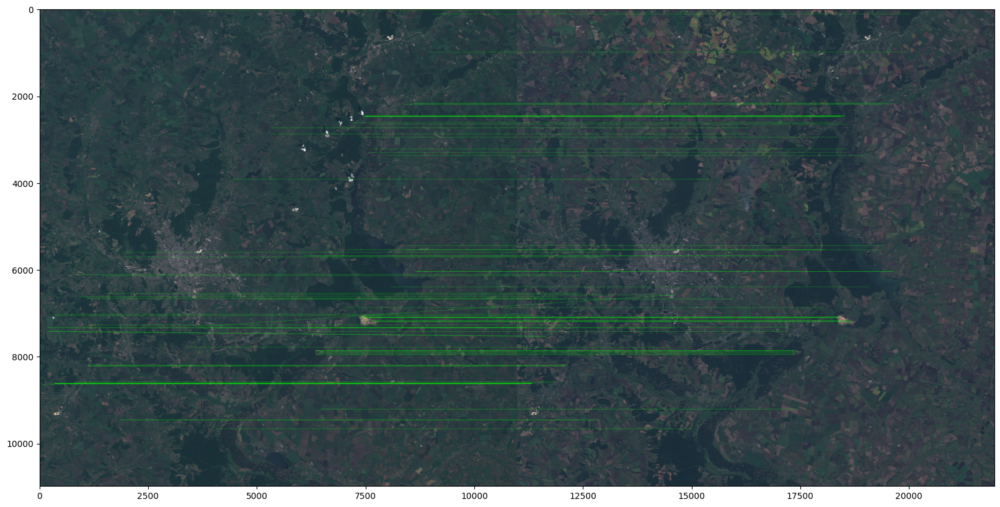

In [22]:
# first test with different seasons and different years
img_path_1 = "new_data/2019_november.jp2"
img_path_2 = "new_data/2016_august.jp2"

match_images(img_path_1,img_path_2)

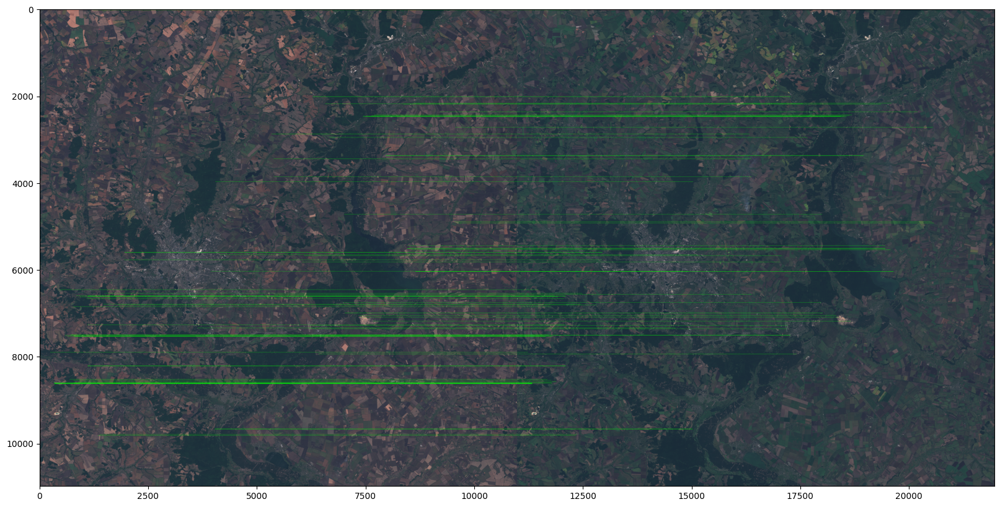

In [23]:
# one more test with different seasons and years
img_path_1 = "new_data/2019_september.jp2"
img_path_2 = "new_data/2016_august.jp2"

match_images(img_path_1,img_path_2)